# Image Processing SoSe 2026 - Assignment - 05

### Deadline is 28.05.2026 at 11:55 a.m.

#### Students: Fabio Herrmann & Julius Böhm

Please solve the assignments together with a partner.

Make sure the code runs without errors, when clicking `Kernel` -> `Restart Kernel & Run All Cells`. Then save the notebook and upload your submission.

In [122]:
# display the plots inside the notebook
%matplotlib inline

In [123]:
import numpy as np
import matplotlib.pyplot as plt
import pylab
from skimage.data import chelsea
from skimage.color import rgb2gray

pylab.rcParams['figure.figsize'] = (12, 8)   # This makes the plot bigger

# Exercise 1 - Filters - 5 Points

Implement and apply the filters below to noisy images. Plot the noisy image vs the filtered one

In [124]:
img = rgb2gray(chelsea() / 255.)

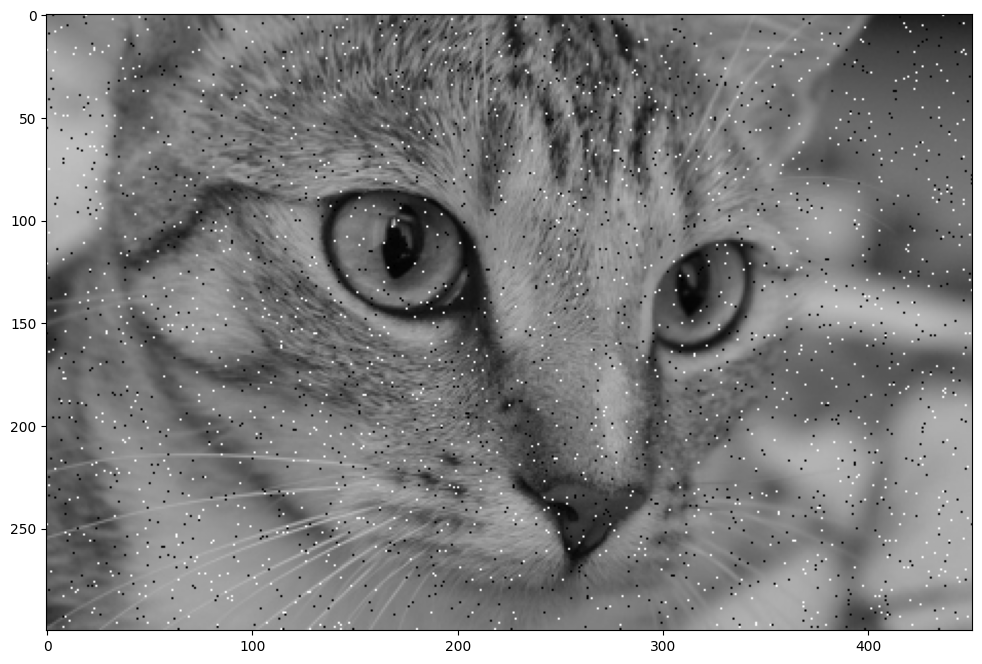

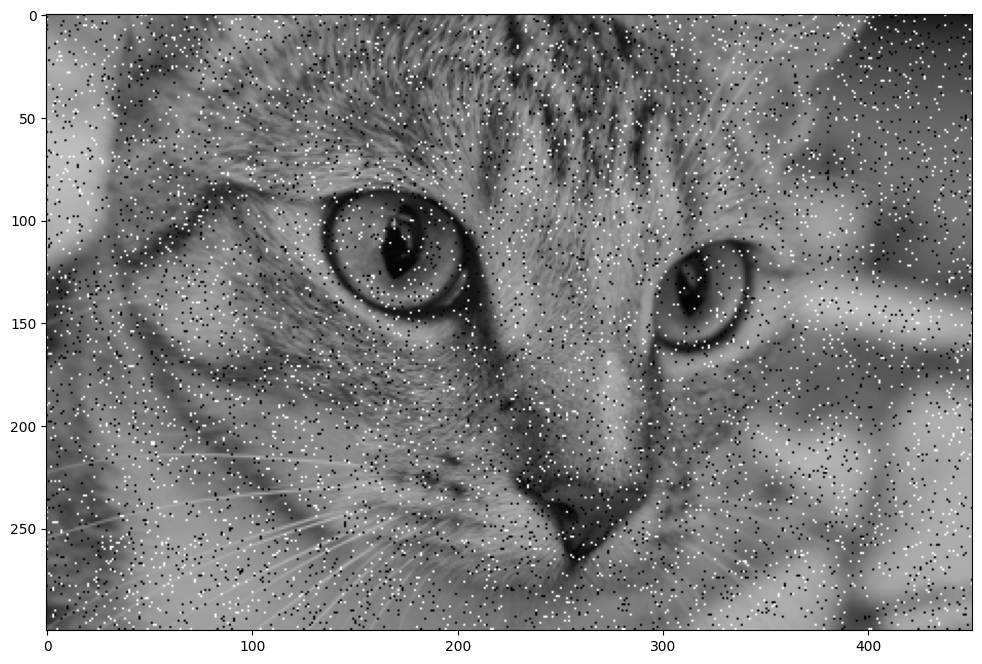

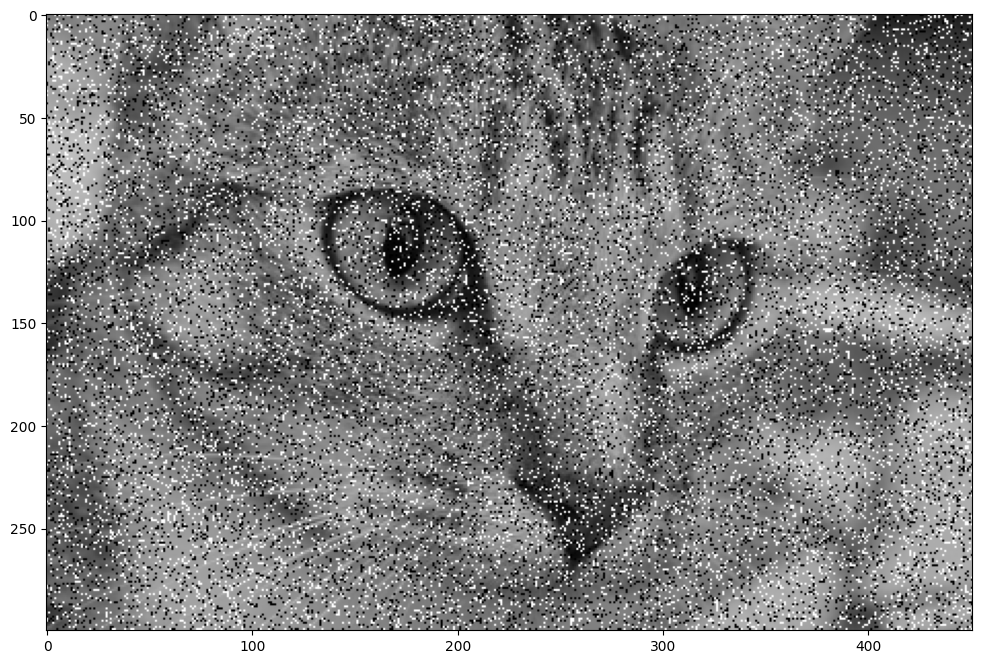

In [125]:
def salt_peper(img, p):
    peper_mask = np.random.binomial(1, p, img.shape).astype(bool)
    salt_mask = np.random.binomial(1, p, img.shape).astype(bool)
    img_noise = img.copy()
    img_noise[peper_mask] = 0
    img_noise[salt_mask] = 1
    return img_noise

salt_peper_noises = [0.01, 0.03, 0.1]
imgs_salt_peper = [salt_peper(img, p) for p in salt_peper_noises]
for img_salt_peper in imgs_salt_peper:
    plt.imshow(img_salt_peper, cmap='gray', vmin=0, vmax=1)
    plt.show()

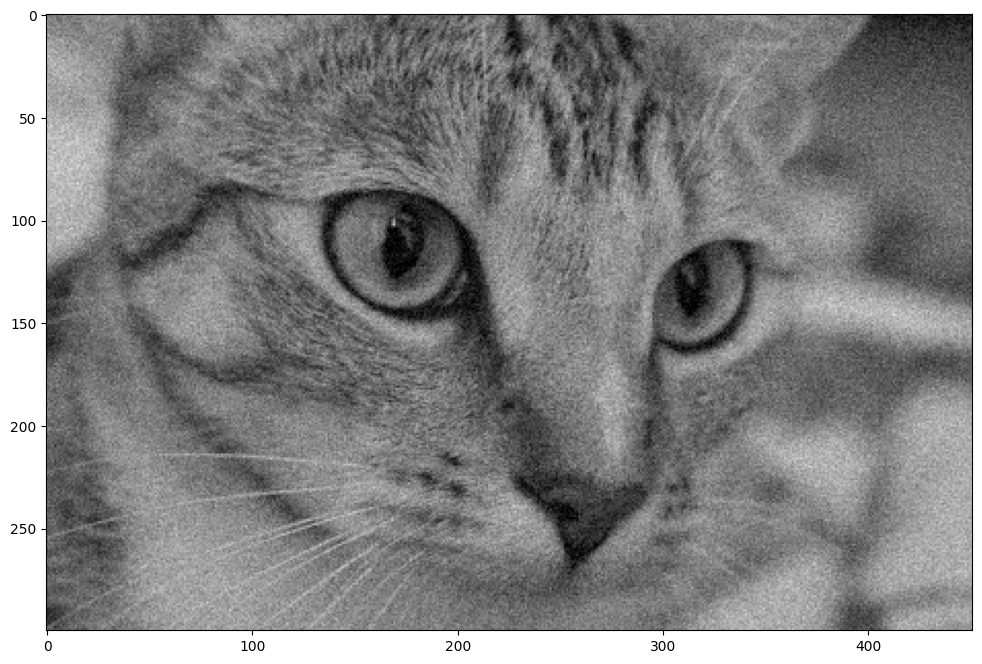

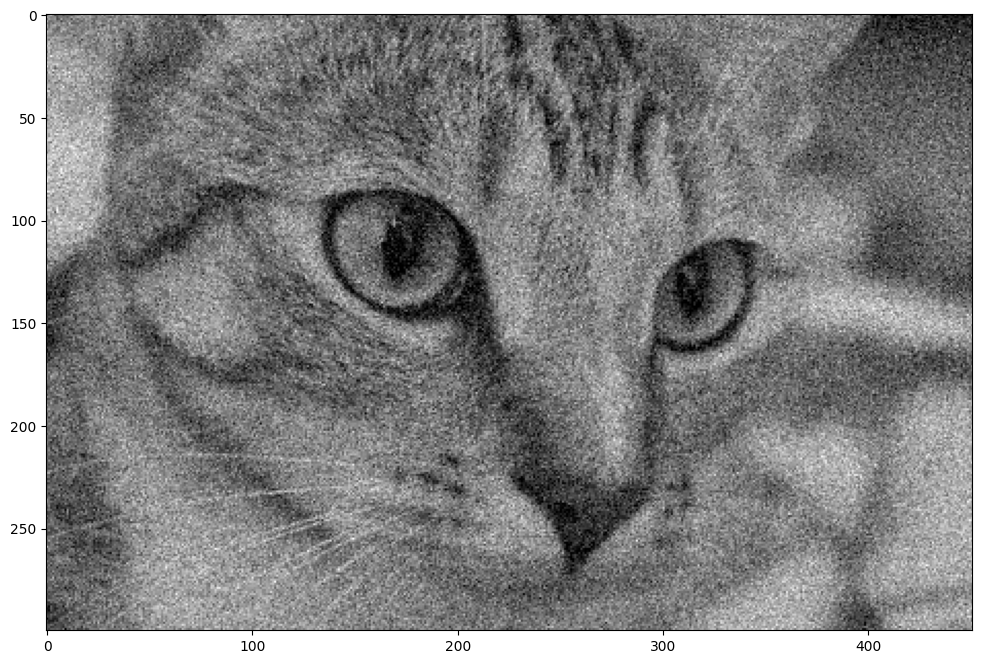

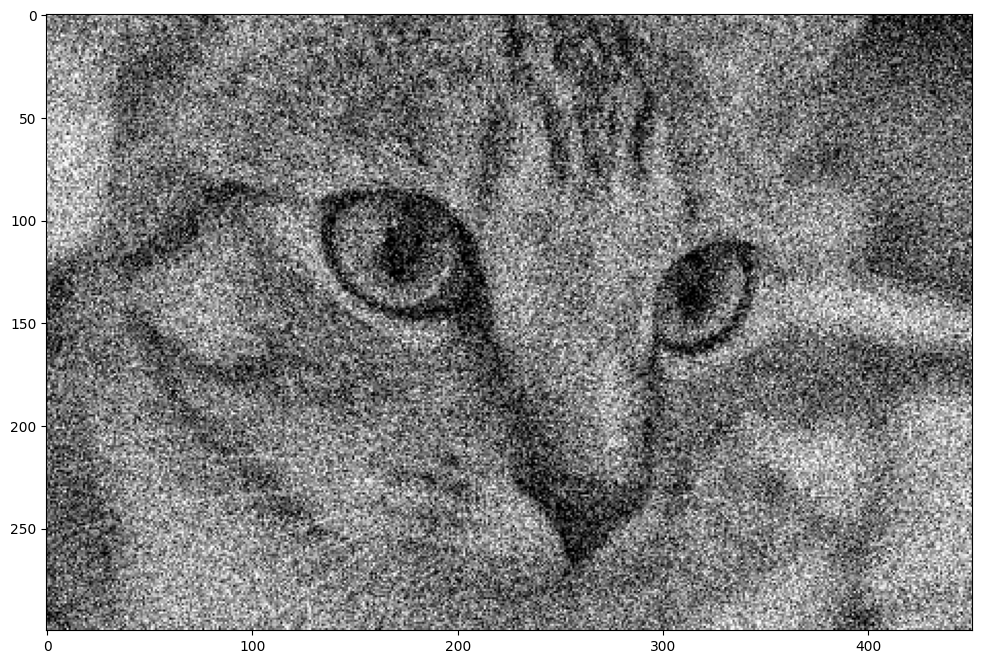

In [126]:
def gaussian_noise(img, std):
    return np.clip(img + np.random.normal(0, std, img.shape), 0, 1)

gaussian_noises = (0.05, 0.10, 0.2)
imgs_gaussian_noise = [gaussian_noise(img, s) for s in gaussian_noises]
for img_gaussian in imgs_gaussian_noise:
    plt.imshow(img_gaussian, cmap='gray', vmin=0, vmax=1)
    plt.show()

In [127]:
def mirror_edge(idx, max_idx):  #mirroring the edge of the pictures to have values for the edge cases
    if idx < 0:
        return -idx
    
    elif idx >= max_idx:
        return 2*max_idx - idx - 2
    
    return idx

# implement the filters:

def arithmetic_mean(img):
    input = np.copy(img)
    output = np.copy(img)           #new pixel values only get set on output img to not mess with the ongoing calculations of means

    height, width = input.shape

    for y in range(height):         #iterating through picture
        for x in range(width):

            summe = 0

            for j in range(-1, 2):      #defining window
                for i in range(-1, 2):

                    yy = mirror_edge(y + j, height)
                    xx = mirror_edge(x + i, width)

                    summe += input[yy, xx]

            output[y, x] = summe / 9

    return output

def geometric_mean(img):
    input = np.copy(img)
    output = np.copy(img)           

    height, width = input.shape

    for y in range(height):
        for x in range(width):

            produkt = 1

            for j in range(-1, 2):
                for i in range(-1, 2):

                    yy = mirror_edge(y + j, height)
                    xx = mirror_edge(x + i, width)

                    produkt *= input[yy, xx]

            output[y, x] = produkt ** (1/9)

    return output

def contraharmonic_mean(img, q=(0.5)):
    input = np.copy(img)
    output = np.copy(img)           

    height, width = input.shape

    for y in range(height):
        for x in range(width):

            zaehler = 0
            nenner = 0

            for j in range(-1, 2):
                for i in range(-1, 2):

                    yy = mirror_edge(y + j, height)
                    xx = mirror_edge(x + i, width)

                    pixel = input[yy, xx] +1e-8             #for q<0 

                    zaehler += pixel ** (q + 1)
                    nenner += pixel ** q

            output[y, x] = zaehler / nenner

    return output

def adaptive_mean(img):
    input = np.copy(img)
    output = np.copy(img)

    height, width = input.shape

    noise_varianz = 1

    for y in range(height):
        for x in range(width):

            werte = []

            for j in range(-1, 2):
                for i in range(-1, 2):

                    yy = mirror_edge(y + j, height)
                    xx = mirror_edge(x + i, width)

                    werte.append(input[yy, xx])

            summe = 0
            for wert in werte:
                summe += wert

            mean = summe / len(werte)

            varianz_summe = 0
            for wert in werte:
                varianz_summe += (wert-mean) ** 2

            lokal_varianz = varianz_summe / len(werte)

            pixel = input[y, x]

            if lokal_varianz == 0:
                output[y, x] = mean
            else:
                factor = noise_varianz / lokal_varianz

                if factor > 1:
                    factor = 1

                new_pixel = pixel - factor * (pixel - mean)

                new_pixel = max(0, min(255, new_pixel))

                output[y, x] = new_pixel

    return output



def adaptive_median(img, s_max = 7):
    input = np.copy(img)
    output = np.copy(img)

    height, width = input.shape

    for y in range(height):
        for x in range(width):

            window_size = 3

            while True:

                werte = []

                radius = window_size // 2

                for j in range(-1, 2):
                    for i in range(-1, 2):

                        yy = mirror_edge(y + j, height)
                        xx = mirror_edge(x + i, width)

                        werte.append(input[yy, xx])
                
                werte.sort()

                z_min = werte[0]
                z_max = werte[-1]
                z_med = werte[len(werte) // 2]
                z_xy = input[y, x]

                if z_min < z_med and z_med < z_max:

                    if z_min < z_xy and z_xy < z_max:

                        output[y, x] = z_xy

                    else:

                        output[y, x] = z_med

                    break
            
                else:

                    window_size += 2

                    if window_size > s_max:
                        output[y, x] = z_med
                        break

    return output


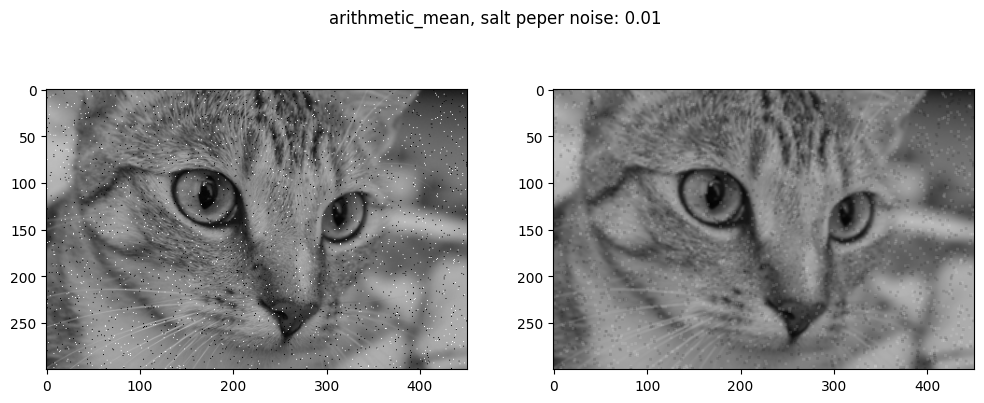

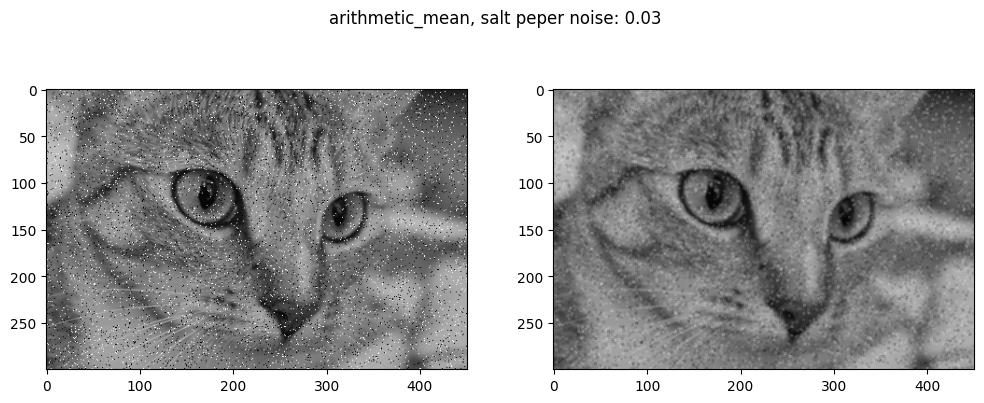

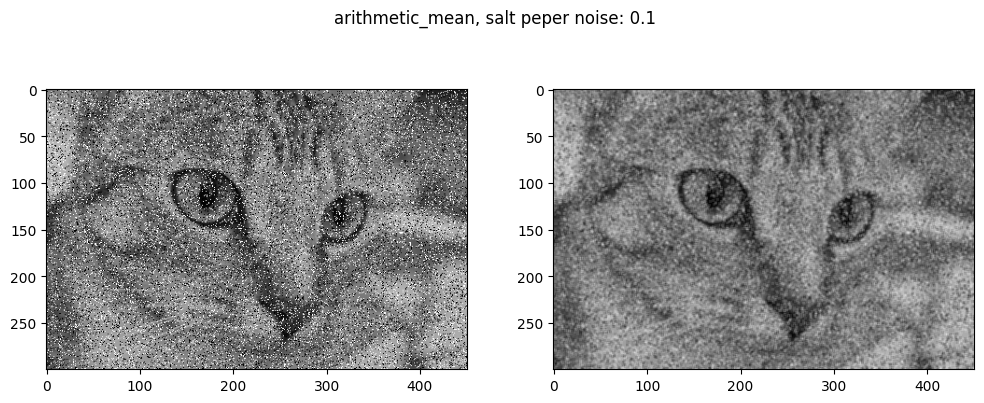

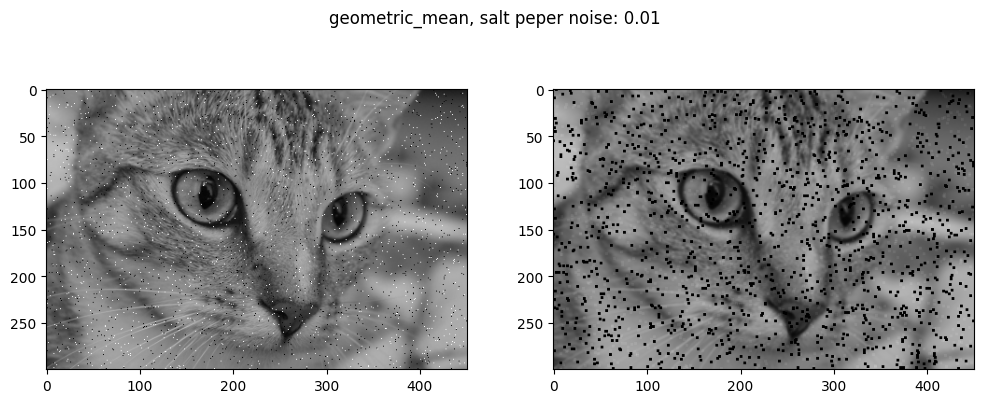

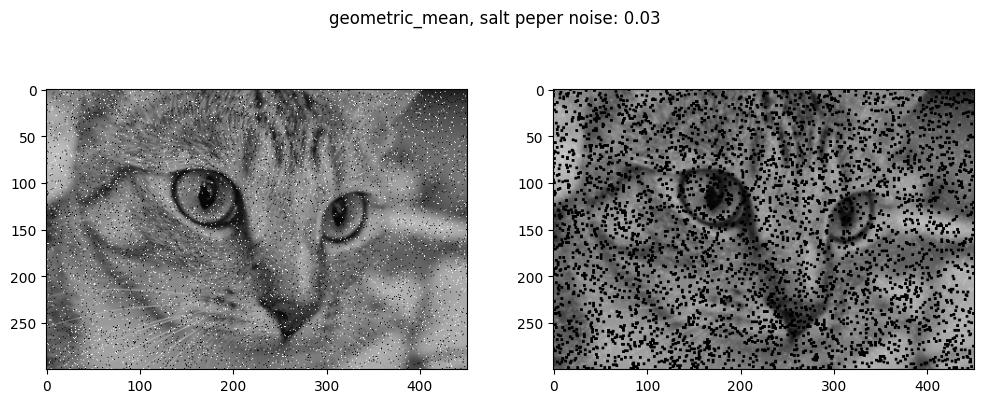

...

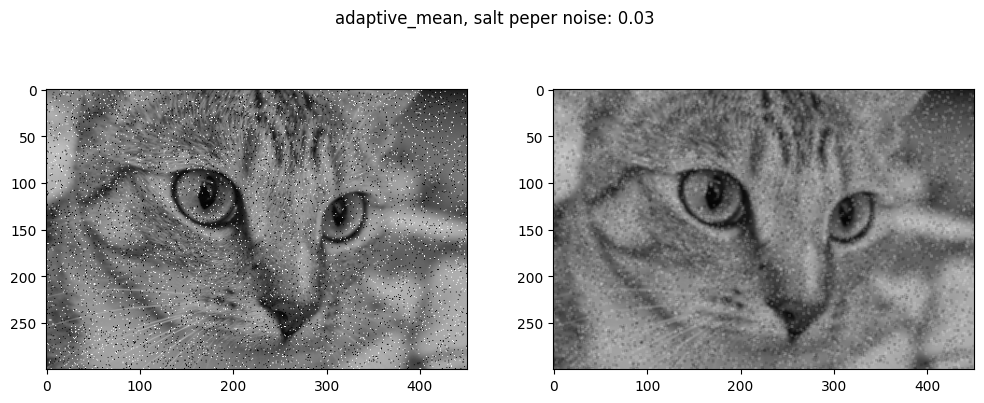

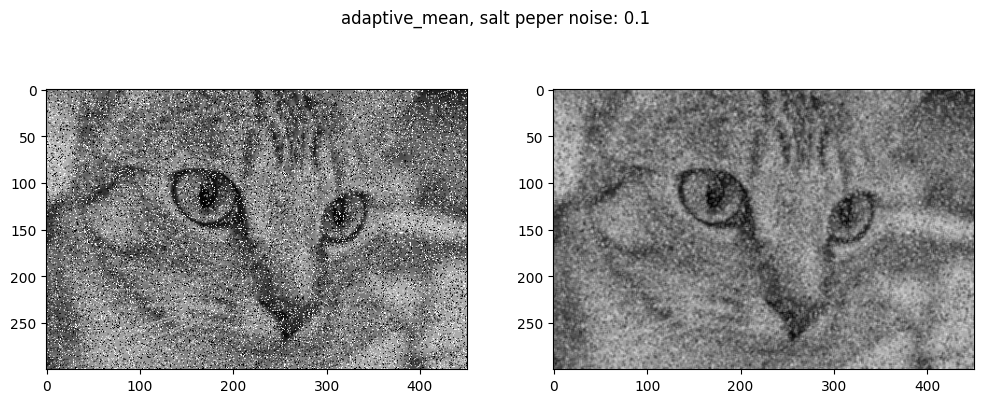

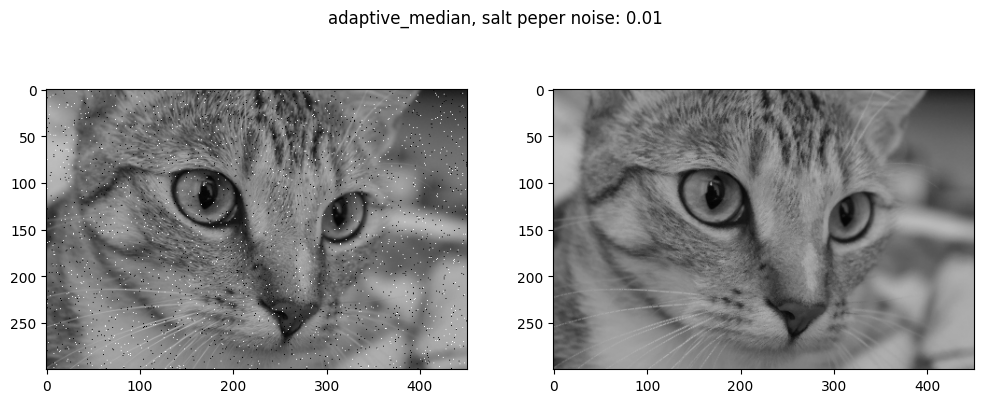

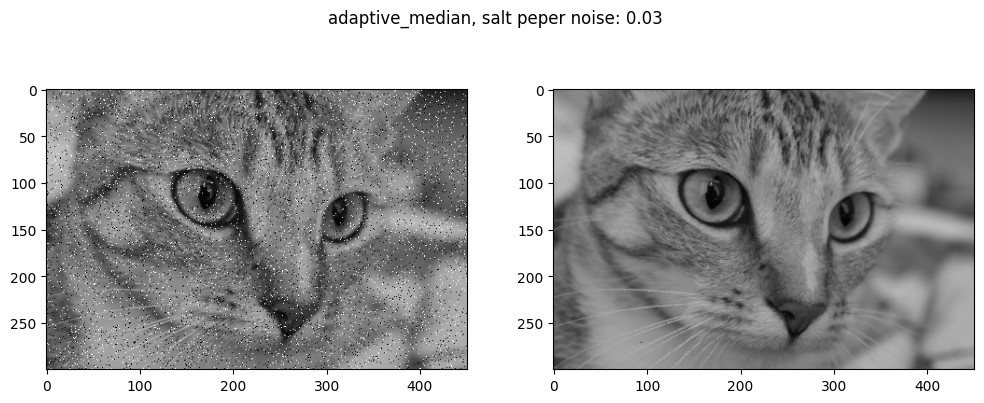

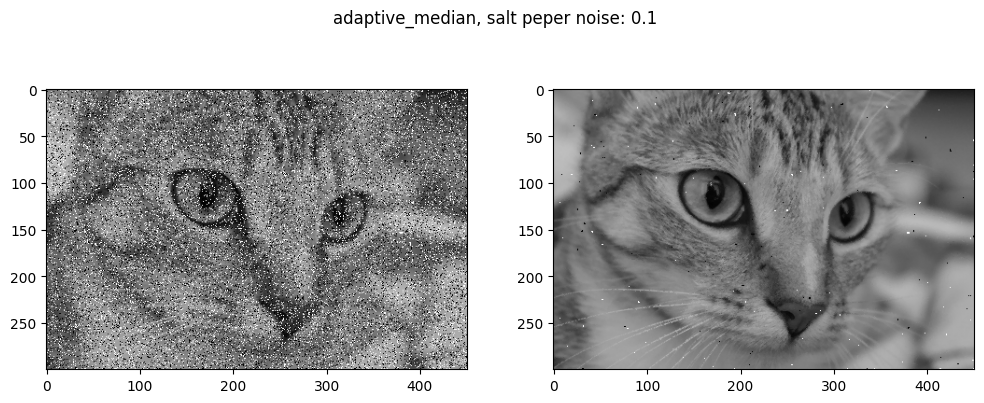

In [128]:
filters = [arithmetic_mean, geometric_mean, contraharmonic_mean, 
filters = [arithmetic_mean, geometric_mean, contraharmonic_mean, 
           adaptive_mean, adaptive_median]
for filter in filters:
    for sp, img_sp in zip(salt_peper_noises, imgs_salt_peper):
        plt.suptitle(filter.__name__ + ", salt peper noise: {}".format(sp))
        plt.subplot(221)
        plt.imshow(img_sp, cmap='gray')
        plt.subplot(222)
        plt.imshow(filter(img_sp.copy()), cmap='gray', vmin=0, vmax=1)
        plt.show()


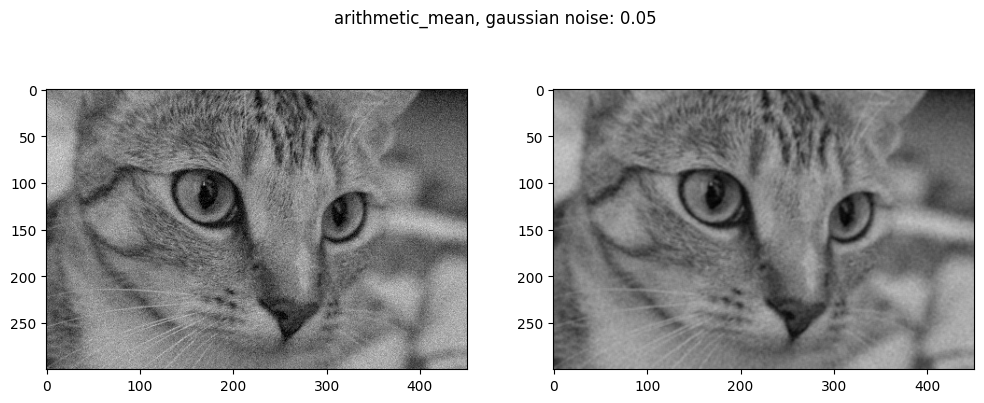

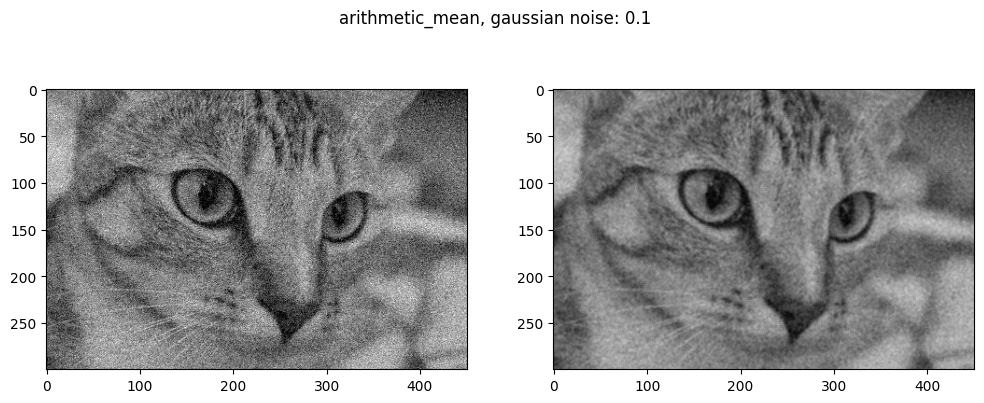

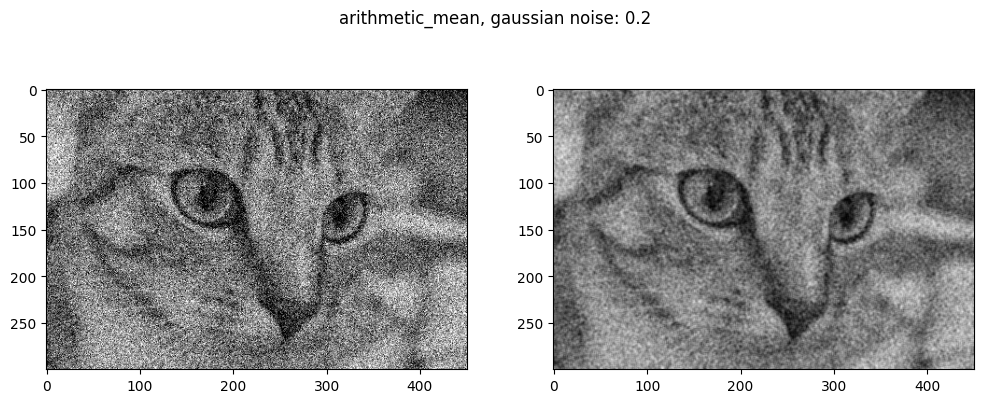

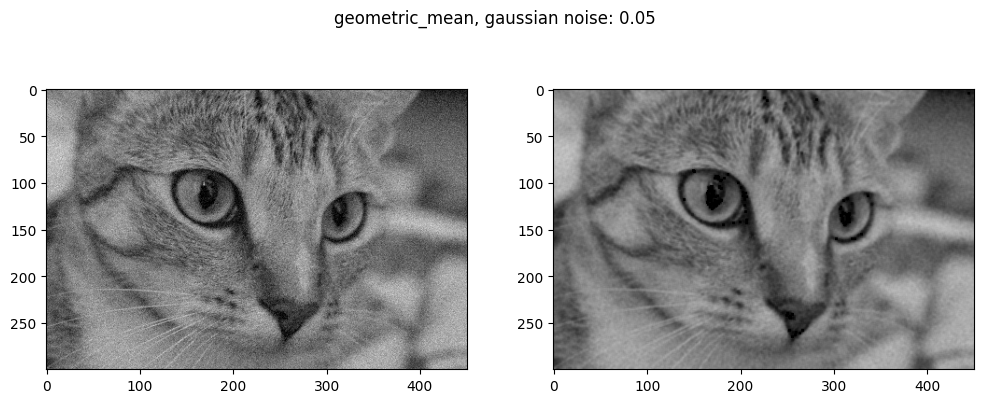

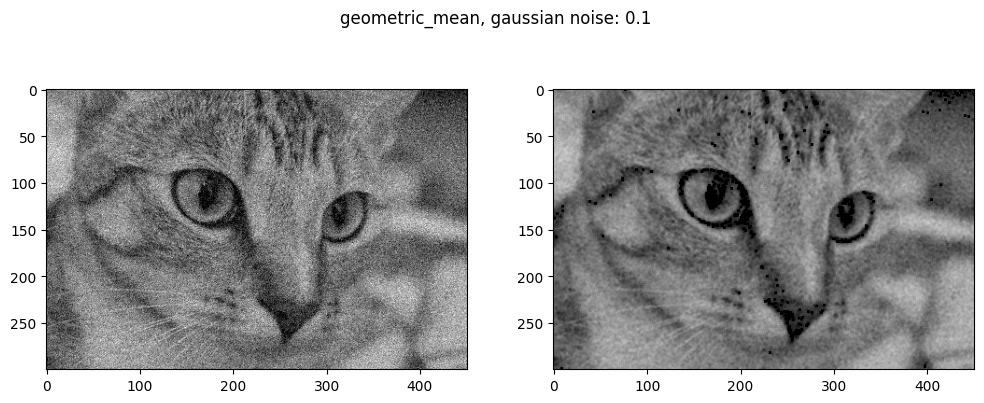

...

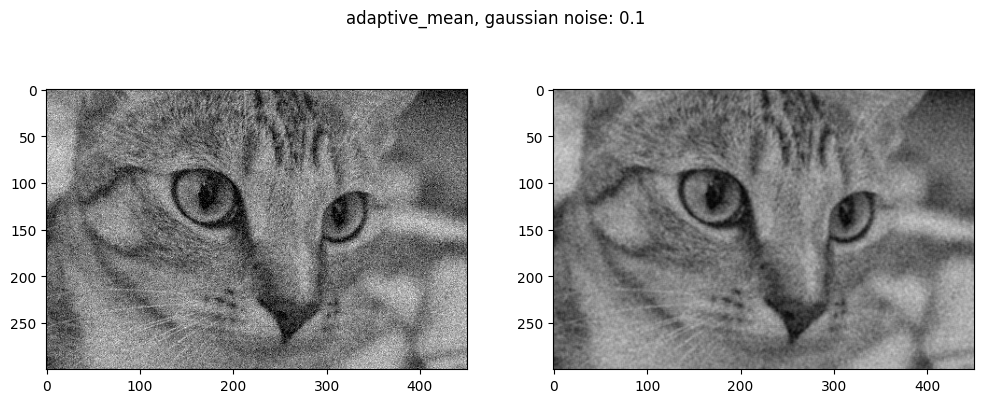

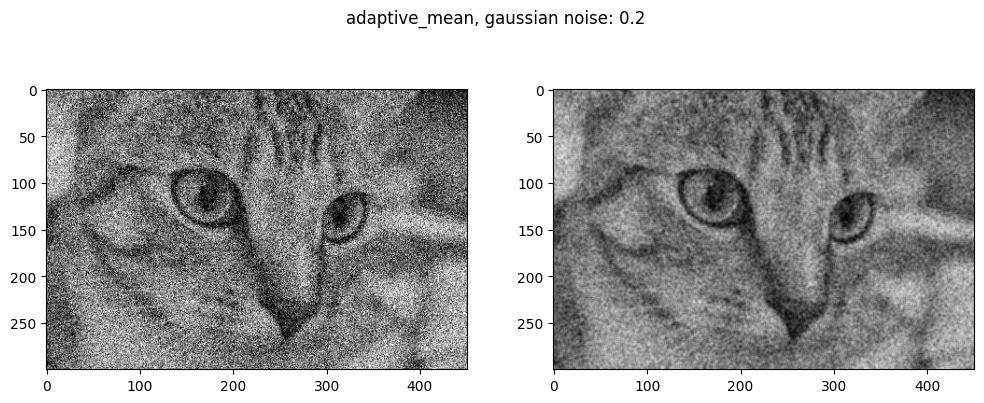

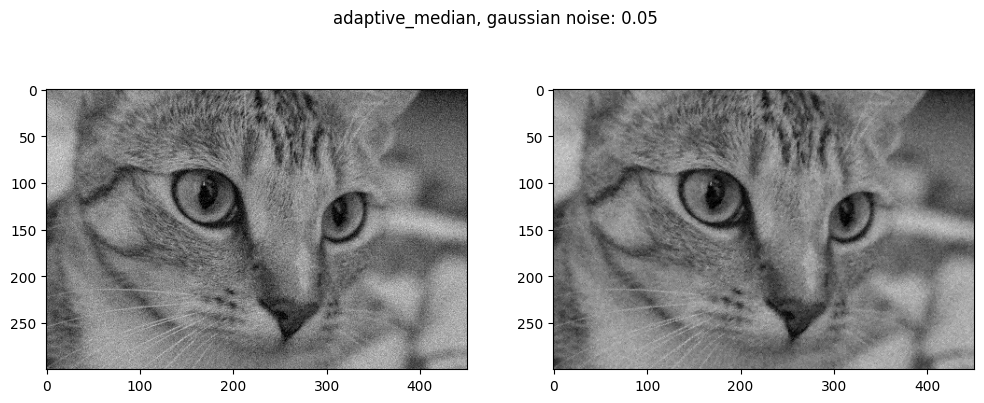

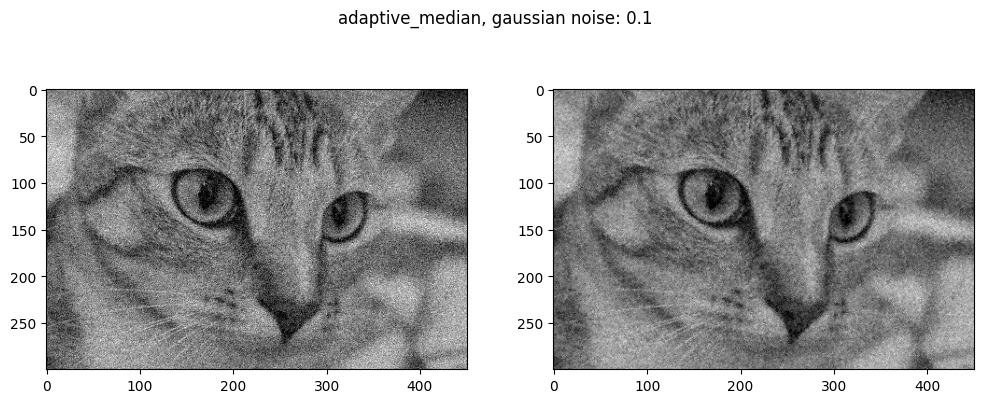

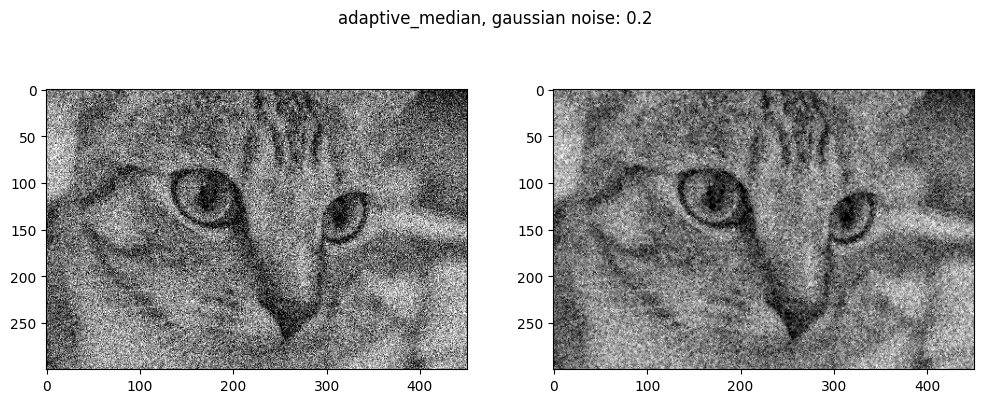

In [129]:
for filter in filters:
    for gn, img_gn in zip(gaussian_noises, imgs_gaussian_noise):
        plt.suptitle(filter.__name__ + ", gaussian noise: {}".format(gn))
        plt.subplot(221)
        plt.imshow(img_gn, cmap='gray', vmin=0, vmax=1)
        plt.subplot(222)
        plt.imshow(filter(img_gn.copy()), cmap='gray', vmin=0, vmax=1)
        plt.show()

# Exercise 2 - Sharpening - 5 Points

Sharpen the image `img_blurry`. You need to implement the `sharp_laplacian` and `unsharp_masking` functions. You might
consider some processing steps before sharpening.

In [130]:
from skimage.filters import gaussian

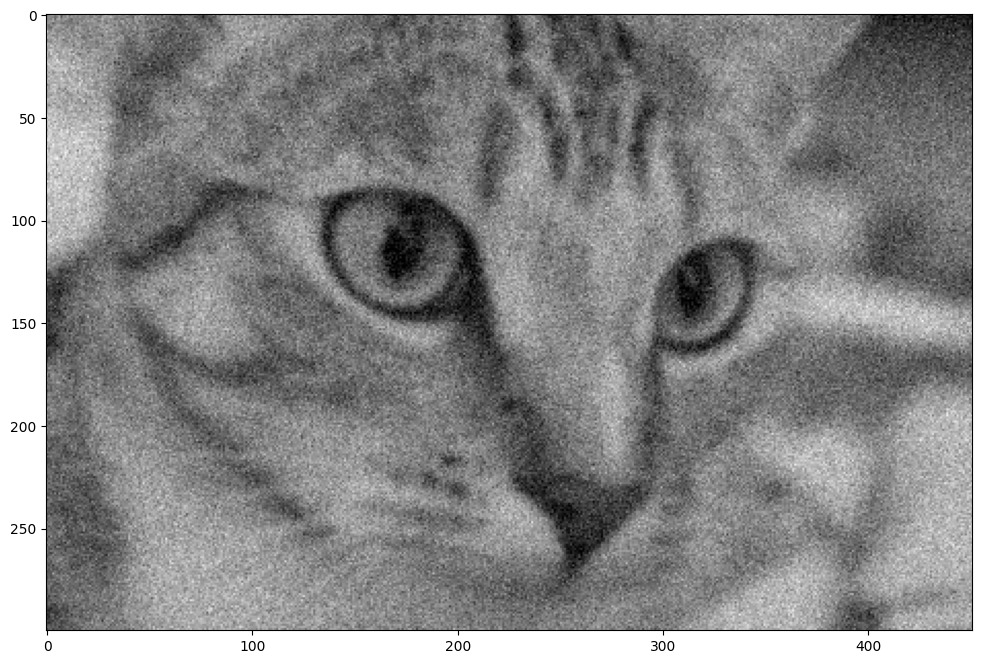

In [131]:
img_blurry = gaussian_noise(gaussian(img , 1.6), 0.07)
plt.imshow(img_blurry, cmap='gray')
plt.show()

In [132]:
def sharp_laplacian(img):
    """Perform sharpening with a laplacian filter"""
    image = np.copy(img)

    for i in range(2):
        image = arithmetic_mean(image)

    denoised_img = np.copy(image)

    height, width = image.shape

    kernel = np.array([[0,  1, 0],
                       [1, -4, 1],
                       [0,  1, 0]])
    
    c = -1
    
    for y in range(1, height-1):
        for x in range(1, width-1):

            window = image[y-1:y+2, x-1:x+2]

            laplacian = np.sum(kernel * window)

            wert = image[y, x] + c * laplacian

            wert = max(0, min(255, wert))

            denoised_img[y, x] = wert

    return denoised_img

def unsharp_masking(img, k=0.5):
    """Perform sharpening by unsharp masking"""
    image = np.copy(img)
    blurred = np.copy(image)
    output = np.copy(image)

    for i in range(2):
        blurred = arithmetic_mean(blurred)

    height, width = image.shape

    for y in range(height):
        for x in range(width):

            mask = image[y, x] - blurred[y, x]

            wert = image[y, x] + k * mask

            wert = max(0, min(255, wert))

            output[y, x] = wert

    return output

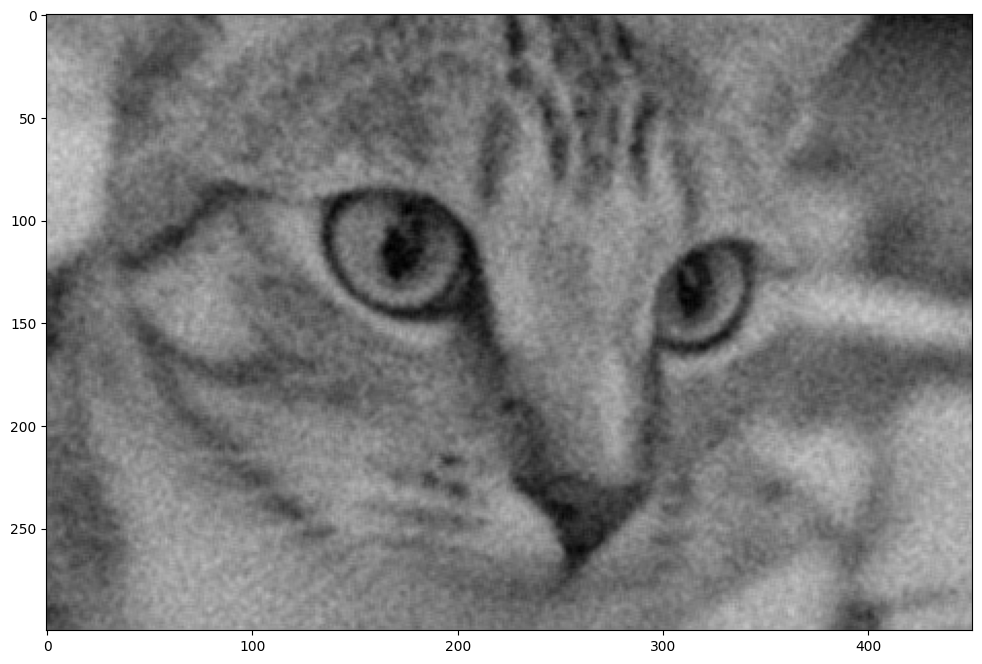

In [133]:
plt.imshow(sharp_laplacian(img_blurry), cmap='gray', vmin=0, vmax=1)
plt.show()

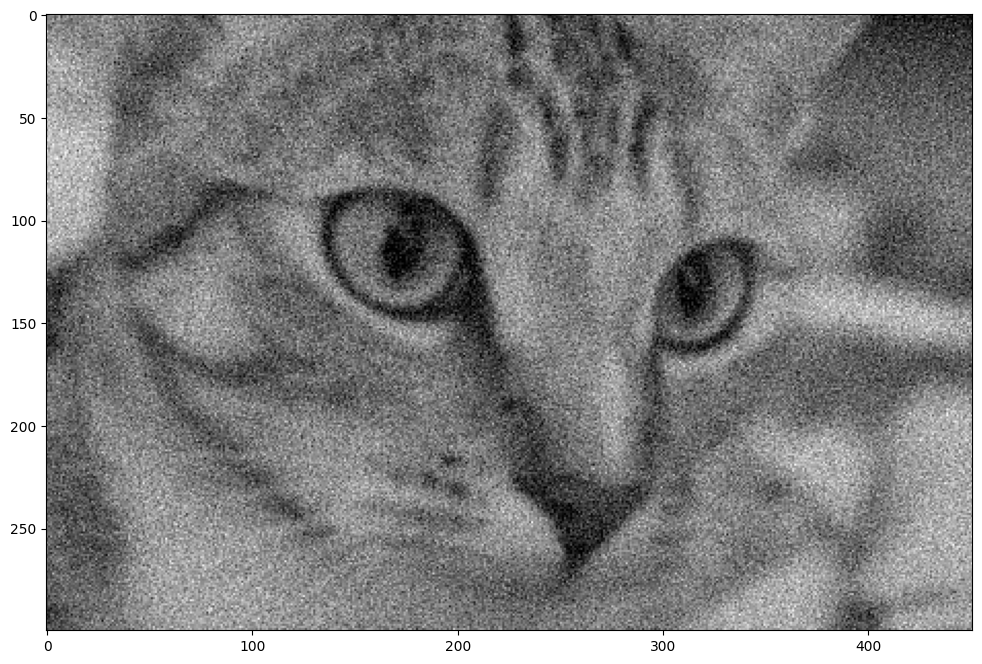

In [134]:
plt.imshow(unsharp_masking(img_blurry), cmap='gray', vmin=0, vmax=1)
plt.show()